# Assignment 4

**Submission deadlines:**

  - Tuesday/Wednesday/Friday groups: 06/07/09.05.2025

**Points:** Aim to get 9 points

# Task 1. Playing with YoLO (from torch.hub)

In this task, you will download pre-trained weights for the YOLOv5 model and use it to detect objects in an image.
You will use the `torch.hub` library to download the model and weights. The model is trained on the COCO dataset, which contains 80 classes of objects.

## Introduction to YoLOv5

### Installation
You need to install OpenCV and PyTorch. You can do this using pip:
```bash
pip install opencv-python torch torchvision
```

### Additional dependencies
In case you have any errors related to OpenCV (missing libgl1.so.1), you may need to install additional dependencies. You can do this using the following command:
```bash
sudo apt install libgl1-mesa-glx libgl1 libglib2.0-0
```

### Downloading the model

In [ ]:
!pip install opencv-python torch torchvision
!sudo apt install libgl1-mesa-glx libgl1 libglib2.0-0



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
import torch
from PIL import Image
import requests
from io import BytesIO

In [ ]:
# Download YoLOv5 weights
yolo_model = torch.hub.load("ultralytics/yolov5", "yolov5s")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
yolo_model.to(device)
yolo_model.eval()

print("YOLOv5 model loaded and ready to use.")

/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2025-5-19 Python-3.11.12 torch-2.6.0+cu124 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 200MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


YOLOv5 model loaded and ready to use.


### Inference

💡 ProTip: Input images are automatically transferred to the correct model device before inference.

In [ ]:
image_url = "https://ultralytics.com/images/zidane.jpg"

results = yolo_model(image_url)

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


image 1/1: 720x1280 2 persons, 1 tie, 1 cell phone
Speed: 1017.4ms pre-process, 684.0ms inference, 35.7ms NMS per image at shape (1, 3, 384, 640)


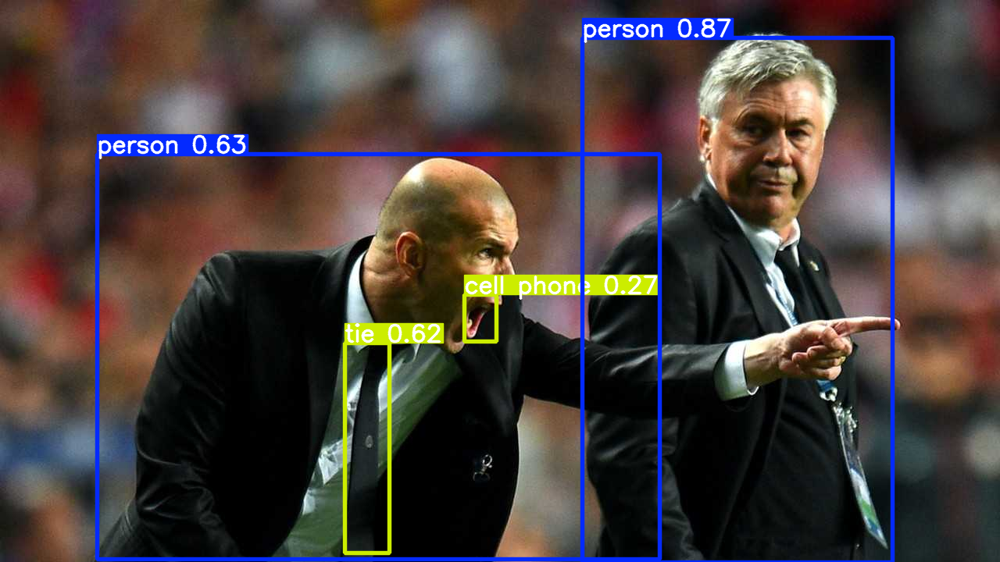

In [ ]:
results.print()  # Print results to console
results.show()   # Display results in a window

In [ ]:
results.xyxy # Get predictions in xyxy format

[tensor([[7.45579e+02, 4.84702e+01, 1.14269e+03, 7.20000e+02, 8.68910e-01, 0.00000e+00],
         [1.24744e+02, 1.97334e+02, 8.44397e+02, 7.16651e+02, 6.30325e-01, 0.00000e+00],
         [4.41239e+02, 4.39351e+02, 4.98381e+02, 7.08571e+02, 6.16792e-01, 2.70000e+01],
         [5.94082e+02, 3.77300e+02, 6.35424e+02, 4.37148e+02, 2.74013e-01, 6.70000e+01]])]

In [ ]:
results.xywhn[0]        # Get predictions in xywhn format
results.pandas().xywhn  # Get predictions in pandas DataFrame format

[    xcenter   ycenter     width    height  confidence  class        name
 0  0.737607  0.533660  0.310247  0.932680    0.868910      0      person
 1  0.378571  0.634712  0.562229  0.721272    0.630325      0      person
 2  0.367039  0.797168  0.044642  0.373917    0.616792     27         tie
 3  0.480276  0.565589  0.032299  0.083121    0.274013     67  cell phone]

## Raw predictions

Above, you have already gotten the results after applying Non-Max Suppression (NMS) and thresholding.
The model outputs a list of predictions, which are the bounding boxes (bboxes) around the detected objects.

In this task, you will visualize the raw predictions and implement the NMS and thresholding yourself.

In [ ]:
# Here are some additional attributes you can check for the YOLOv5 model
print(yolo_model.conf) # NMS confidence threshold
print(yolo_model.iou)  # NMS IoU threshold

0.25
0.45


Below is the code to load the image into tensor and run `yolo_model.model(image_tensor)` to get the raw predictions.

This will give you a tensor of shape `(1, num_boxes, 85)`, where `num_boxes` is the number of detected boxes and 85 is the number as follows: 4 coordinates of the box, 1 objectness score, and 80 class scores.

In [ ]:
import numpy as np
import cv2

response = requests.get(image_url)
image = Image.open(BytesIO(response.content)).convert("RGB")
image_np = np.array(image)  # Convert PIL image to NumPy array

# Letterbox resize to 640x640 (preserve aspect ratio with padding)
def letterbox(im, new_shape=(640, 640), color=(114, 114, 114)):
    shape = im.shape[:2]  # current shape [height, width]
    r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
    new_unpad = (int(round(shape[1] * r)), int(round(shape[0] * r)))
    dw = new_shape[1] - new_unpad[0]
    dh = new_shape[0] - new_unpad[1]
    dw /= 2
    dh /= 2
    im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)
    top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
    left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
    im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return im

img_letterboxed = letterbox(image_np)
img_tensor = torch.from_numpy(img_letterboxed).permute(2, 0, 1).float() / 255.0  # HWC → CHW and normalize
img_tensor = img_tensor.unsqueeze(0).to(device)

# Inference without NMS
with torch.no_grad():
    raw_preds = yolo_model.model(img_tensor)  # tensor of shape [1, 25200, 85]

print("Raw prediction shape:", raw_preds.shape)

Raw prediction shape: torch.Size([1, 25200, 85])


In [ ]:
#objectness score - jak bardzo model wierzy, że w danym oknie znajduje się jakiś obiekt (niezależnie od jego rodzaju). Zakres [0,1]
#class score - pstwo konkretnej klasy
#confidence=objectness score * class score

## Problem
1. (**0.25p**) Please describe the output tensor and how to interpret it. Especially, explain the meaning of the 5th number, i.e. the objectness score. How is it calculated and related to the class scores?
2. **1p**  Implement the NMS and thresholding yourself.
3. **1p**  Visualize the raw predictions and the predictions after NMS and thresholding.
4. (**0.25p**) Compare the results with the original predictions.
5. (**0.5p**) Vary IoU threshold for NMS and show its effect on detections.
6. (**1p**) Calculate precision, recall, F1 for different IoU thresholds. Calculate `mAP@0.5` (mean Average Precision at an Intersection over Union (IoU) threshold of 0.5) for the model predictions; see https://www.v7labs.com/blog/mean-average-precision
7. (**1p**) Experiment with your own images. Find examples where NMS removes a valid detection (e.g., overlapping people).


### Bonus points:
8. (**1p**) Implement Soft-NMS and compare results; see https://arxiv.org/abs/1704.04503
Does it help in scenes with many overlapping objects?




In [ ]:
import torch

CONF_THRESHOLD = 0.25
IOU_THRESHOLD = 0.45

preds = raw_preds[0]  # [25200, 85]
print("Raw preds shape:", preds.shape)

boxes = preds[:, :4]              # [x_center, y_center, width, height]
objectness = preds[:, 4]
class_probs = preds[:, 5:]


scores, labels = class_probs.max(1)
confidences = objectness * scores


mask = confidences > CONF_THRESHOLD
boxes = boxes[mask]
confidences = confidences[mask]
labels = labels[mask]

# zamiana z xywh na xyxy
def xywh_to_xyxy(x):
    x1 = x[:, 0] - x[:, 2] / 2
    y1 = x[:, 1] - x[:, 3] / 2
    x2 = x[:, 0] + x[:, 2] / 2
    y2 = x[:, 1] + x[:, 3] / 2
    return torch.stack([x1, y1, x2, y2], dim=1)

boxes_xyxy = xywh_to_xyxy(boxes)


def compute_iou(box1, box2):
    # box1: [N, 4], box2: [1, 4]
    x1 = torch.max(box1[:, 0], box2[:, 0])
    y1 = torch.max(box1[:, 1], box2[:, 1])
    x2 = torch.min(box1[:, 2], box2[:, 2])
    y2 = torch.min(box1[:, 3], box2[:, 3])

    inter = (x2 - x1).clamp(min=0) * (y2 - y1).clamp(min=0)
    area1 = (box1[:, 2] - box1[:, 0]) * (box1[:, 3] - box1[:, 1])
    area2 = (box2[:, 2] - box2[:, 0]) * (box2[:, 3] - box2[:, 1])
    union = area1 + area2 - inter

    return inter / union


def nms_manual(boxes, scores, iou_threshold=0.45):
    keep = []
    indices = scores.argsort(descending=True)

    while indices.numel() > 0:
        i = indices[0]
        keep.append(i.item())

        if indices.numel() == 1:
            break

        rest = indices[1:]
        ious = compute_iou(boxes[rest], boxes[i].unsqueeze(0))

        indices = rest[ious <= iou_threshold]

    return torch.tensor(keep)


manual_indices = nms_manual(boxes_xyxy, confidences, IOU_THRESHOLD)

final_boxes_manual = boxes_xyxy[manual_indices]
final_scores_manual = confidences[manual_indices]
final_labels_manual = labels[manual_indices]

# dla porównania – torchvision.ops.nms
import torchvision.ops as ops
torch_indices = ops.nms(boxes_xyxy, confidences, IOU_THRESHOLD)

final_boxes_torch = boxes_xyxy[torch_indices]
final_scores_torch = confidences[torch_indices]
final_labels_torch = labels[torch_indices]


print("Manual NMS results:", len(final_boxes_manual))
print("TorchVision NMS results:", len(final_boxes_torch))

print("the same indices?", torch.allclose(torch.sort(manual_indices.float())[0], torch.sort(torch_indices.float())[0]))


Raw preds shape: torch.Size([25200, 85])
Manual NMS results: 4
TorchVision NMS results: 4
the same indices? True


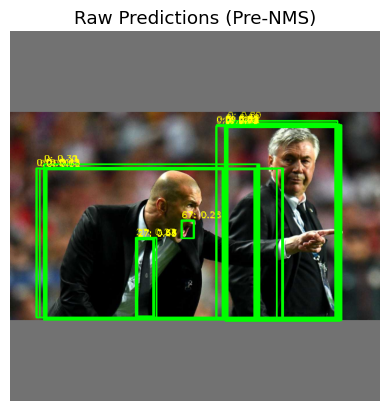

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline


def plot_boxes(img, boxes, title="Predictions"):
    img = img.copy()
    for box in boxes:
        x1, y1, x2, y2, conf, cls = box
        cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        label = f'{int(cls)}: {conf:.2f}'
        cv2.putText(img, label, (int(x1), int(y1) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

preds = raw_preds[0].cpu().numpy()
conf_thresh = 0.25
boxes_raw = []

for pred in preds:
    obj_conf = pred[4]
    class_conf = pred[5:]
    class_id = np.argmax(class_conf)
    conf = obj_conf * class_conf[class_id]
    if conf > conf_thresh:
        cx, cy, w, h = pred[0:4]
        x1 = cx - w / 2
        y1 = cy - h / 2
        x2 = cx + w / 2
        y2 = cy + h / 2
        boxes_raw.append([x1, y1, x2, y2, conf, class_id])

plot_boxes(img_letterboxed, boxes_raw, title="Raw Predictions (Pre-NMS)")


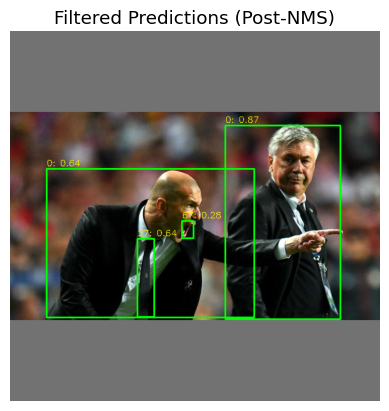

In [ ]:
import torch

boxes = torch.tensor([b[:4] for b in boxes_raw])
scores = torch.tensor([b[4] for b in boxes_raw])
nms_indices = torch.ops.torchvision.nms(boxes, scores, iou_threshold=0.45)

boxes_nms = [boxes_raw[i] for i in nms_indices]
plot_boxes(img_letterboxed, boxes_nms, title="Filtered Predictions (Post-NMS)")


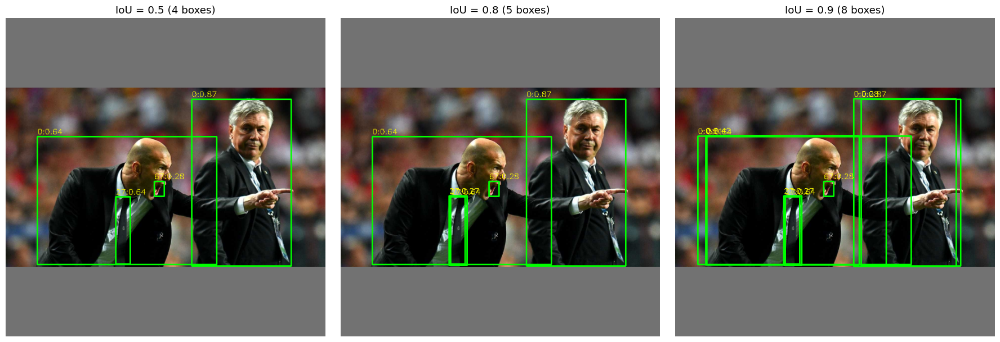

In [ ]:
def apply_nms_and_get_boxes(boxes_raw, iou_thresh):
    boxes = torch.tensor([b[:4] for b in boxes_raw])
    scores = torch.tensor([b[4] for b in boxes_raw])
    indices = torch.ops.torchvision.nms(boxes, scores, iou_threshold=iou_thresh)
    return [boxes_raw[i] for i in indices]

def draw_boxes_on_image(img, boxes, title):
    img_draw = img.copy()
    for box in boxes:
        x1, y1, x2, y2, conf, cls = box
        cv2.rectangle(img_draw, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        cv2.putText(img_draw, f'{int(cls)}:{conf:.2f}', (int(x1), int(y1)-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 1)
    return img_draw

iou_thresholds = [0.5, 0.8, 0.9]
fig, axs = plt.subplots(1, len(iou_thresholds), figsize=(18, 6))

for idx, iou in enumerate(iou_thresholds):
    boxes_nms = apply_nms_and_get_boxes(boxes_raw, iou)
    img_result = draw_boxes_on_image(img_letterboxed, boxes_nms, f'IoU={iou}')
    axs[idx].imshow(img_result)
    axs[idx].set_title(f'IoU = {iou} ({len(boxes_nms)} boxes)')
    axs[idx].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import torch
import torchvision
from torchvision.datasets.utils import download_and_extract_archive

url = "https://github.com/ultralytics/yolov5/releases/download/v1.0/coco128.zip"
download_and_extract_archive(url, download_root="./data", extract_root="./data")


In [ ]:
import os
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T
import torchvision.ops as ops
from collections import defaultdict

def compute_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    return inter_area / (union_area + 1e-6)

def compute_ap(recall, precision):
    mrec = np.concatenate(([0.], recall, [1.]))
    mpre = np.concatenate(([0.], precision, [0.]))

    for i in range(mpre.size - 1, 0, -1):
        mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

    i = np.where(mrec[1:] != mrec[:-1])[0]
    ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap

def calculate_metrics(pred_boxes, pred_labels, pred_scores, gt_boxes, gt_labels, iou_threshold):
    if len(pred_boxes) == 0 or len(gt_boxes) == 0:
        return 0.0, 0.0, 0.0  # zeros if no predictions or ground truths

    # sort predictions by confidence
    sorted_indices = np.argsort(-pred_scores)
    pred_boxes = pred_boxes[sorted_indices]
    pred_labels = pred_labels[sorted_indices]
    pred_scores = pred_scores[sorted_indices]

    true_positives = np.zeros(len(pred_boxes))
    false_positives = np.zeros(len(pred_boxes))
    gt_matched = {i: False for i in range(len(gt_boxes))}

    for i, (pb, pl) in enumerate(zip(pred_boxes, pred_labels)):
        best_iou = 0
        best_gt_idx = -1

        for j, (gb, gl) in enumerate(zip(gt_boxes, gt_labels)):
            if gt_matched[j] or gl != pl:
                continue

            iou = compute_iou(pb, gb)
            if iou > best_iou:
                best_iou = iou
                best_gt_idx = j

        if best_iou >= iou_threshold and best_gt_idx != -1:
            gt_matched[best_gt_idx] = True
            true_positives[i] = 1
        else:
            false_positives[i] = 1

    tp_cumsum = np.cumsum(true_positives)
    fp_cumsum = np.cumsum(false_positives)

    precision = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-6)
    recall = tp_cumsum / (len(gt_boxes) + 1e-6)

    ap = compute_ap(recall, precision)
    return precision[-1], recall[-1], ap

def process_predictions(preds, conf_threshold=0.25):
    preds = preds[0]  # remove batch dimension

    boxes = preds[:, :4]
    conf = preds[:, 4:5]
    cls_scores = preds[:, 5:]

    cls_conf = cls_scores * conf
    cls_conf, cls_ids = cls_conf.max(1, keepdim=True)

    mask = (cls_conf.squeeze() >= conf_threshold)
    boxes = boxes[mask]
    cls_conf = cls_conf[mask]
    cls_ids = cls_ids[mask]

    if len(boxes) == 0:  # no predictions after thresholding
        return torch.zeros((0, 4)), torch.zeros(0), torch.zeros(0)

    boxes_xyxy = torch.zeros_like(boxes)
    boxes_xyxy[:, 0] = boxes[:, 0] - boxes[:, 2] / 2
    boxes_xyxy[:, 1] = boxes[:, 1] - boxes[:, 3] / 2
    boxes_xyxy[:, 2] = boxes[:, 0] + boxes[:, 2] / 2
    boxes_xyxy[:, 3] = boxes[:, 1] + boxes[:, 3] / 2

    return boxes_xyxy, cls_conf.squeeze(), cls_ids.squeeze()

class YOLODataset(Dataset):
    def __init__(self, images_dir, labels_dir, transform=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transform = transform
        self.image_files = sorted([f for f in os.listdir(images_dir) if f.endswith('.jpg')])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.image_files[idx])
        label_path = os.path.join(self.labels_dir, self.image_files[idx].replace('.jpg', '.txt'))

        image = Image.open(img_path).convert("RGB")
        width, height = image.size

        if self.transform:
            image = self.transform(image)

        try:
            with open(label_path, 'r') as f:
                labels = [list(map(float, line.strip().split())) for line in f.readlines()]
        except FileNotFoundError:
            labels = []

        abs_labels = []
        for label in labels:
            class_id, x, y, w, h = label
            x1 = (x - w / 2) * width
            y1 = (y - h / 2) * height
            x2 = (x + w / 2) * width
            y2 = (y + h / 2) * height
            abs_labels.append([class_id, x1, y1, x2, y2])

        return image, torch.tensor(abs_labels) if abs_labels else torch.zeros((0, 5))

def evaluate_model(loader, model, iou_thresholds=np.arange(0.5, 1.0, 0.05), conf_threshold=0.25):
    device = next(model.parameters()).device
    results = {iou: [] for iou in iou_thresholds}

    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(loader):
            try:
                images = images.to(device)
                targets = targets[0].cpu().numpy()

                raw_preds = model(images)
                pred_boxes, pred_scores, pred_labels = process_predictions(raw_preds, conf_threshold)

                if len(pred_boxes) == 0:
                    for iou in iou_thresholds:
                        results[iou].append((0.0, 0.0, 0.0))
                    continue

                # NMS
                keep = ops.nms(pred_boxes, pred_scores, 0.45)
                pred_boxes = pred_boxes[keep].cpu().numpy()
                pred_scores = pred_scores[keep].cpu().numpy()
                pred_labels = pred_labels[keep].cpu().numpy()

                # prepare ground truth - każdy wiersz to: [class_id, x1, y1, x2, y2]
                gt_boxes = targets[:, 1:] if len(targets) > 0 else np.zeros((0, 4))
                gt_labels = targets[:, 0] if len(targets) > 0 else np.zeros(0)

                # metrics
                for iou_thresh in iou_thresholds:
                    prec, rec, ap = calculate_metrics(
                        pred_boxes, pred_labels, pred_scores,
                        gt_boxes, gt_labels, iou_thresh
                    )
                    results[iou_thresh].append((prec, rec, ap))

            except Exception as e:
                print(f"Error processing batch {batch_idx}: {str(e)}")
                continue

    # final metrics
    ap_values = [np.mean([x[2] for x in results[iou]]) for iou in results if len(results[iou]) > 0]
    if not ap_values:
        print("No valid predictions were made across all batches")
        return results

    mAP_50 = np.mean([x[2] for x in results[0.5] if len(results[0.5]) > 0])
    mAP = np.mean(ap_values)

    print(f"mAP@0.5: {mAP_50:.4f}")
    print(f"mAP@0.5:0.95: {mAP:.4f}") # mAP@0.5:0.95 :Averages mAP across 10 different IoU thresholds: 0.50, 0.55, 0.60, ..., 0.95
    return results

model = torch.hub.load("ultralytics/yolov5", "yolov5s", pretrained=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device).eval()

transform = T.Compose([
    T.Resize((640, 640)),
    T.ToTensor()
])

dataset = YOLODataset(
    images_dir="./data/coco128/images/train2017",
    labels_dir="./data/coco128/labels/train2017",
    transform=transform
)

loader = DataLoader(dataset, batch_size=1)
evaluation_results = evaluate_model(loader, model)

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-19 Python-3.11.12 torch-2.6.0+cu124 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning:

Error processing batch 73: scores should be a 1d tensor, got 0D


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.am

mAP@0.5: 0.1565
mAP@0.5:0.95: 0.0486


In [ ]:

def evaluate_model(loader, model, iou_thresholds=np.arange(0.5, 1.0, 0.05), conf_threshold=0.25):
    device = next(model.parameters()).device
    all_preds = defaultdict(list)
    all_gts = defaultdict(list)

    image_id = 0

    with torch.no_grad():
        for images, targets in loader:
            images = images.to(device)
            targets = targets[0].cpu().numpy()

            raw_preds = model(images)
            pred_boxes, pred_scores, pred_labels = process_predictions(raw_preds, conf_threshold)

            if len(pred_boxes) > 0 and pred_scores.ndim == 1 and len(pred_scores) > 0:
                keep = ops.nms(pred_boxes, pred_scores, 0.45)
                pred_boxes = pred_boxes[keep].cpu().numpy()
                pred_scores = pred_scores[keep].cpu().numpy()
                pred_labels = pred_labels[keep].cpu().numpy()

                for box, score, cls in zip(pred_boxes, pred_scores, pred_labels):
                    all_preds[int(cls)].append((image_id, box, score))

            for gt in targets:
                cls, *box = gt
                all_gts[int(cls)].append((image_id, np.array(box)))

            image_id += 1

    results = {}
    for iou_thresh in iou_thresholds:
        class_aps = {}
        for cls in sorted(set(all_preds.keys()) | set(all_gts.keys())): # dla kazdej klasy
            preds = all_preds.get(cls, [])
            gts = all_gts.get(cls, [])

            preds.sort(key=lambda x: -x[2]) #sortuj po conf score

            tp = np.zeros(len(preds))
            fp = np.zeros(len(preds))
            gt_used = defaultdict(set)

            gt_by_img = defaultdict(list)
            for img_id, box in gts:
                gt_by_img[img_id].append(box)

            for i, (img_id, pred_box, _) in enumerate(preds):
                matched = False
                gt_boxes = gt_by_img.get(img_id, [])

                for j, gt_box in enumerate(gt_boxes):
                    if j in gt_used[img_id]:
                        continue
                    iou = compute_iou(pred_box, gt_box)
                    if iou >= iou_thresh:
                        tp[i] = 1
                        gt_used[img_id].add(j)
                        matched = True
                        break

                if not matched:
                    fp[i] = 1

            if len(gts) == 0:
                recall = np.zeros(len(tp))
            else:
                recall = np.cumsum(tp) / (len(gts) + 1e-6)

            precision = np.cumsum(tp) / (np.cumsum(tp + fp) + 1e-6)
            ap = compute_ap(recall, precision)
            class_aps[cls] = ap

        results[iou_thresh] = class_aps
        print(class_aps)

    for iou in iou_thresholds:
        aps = list(results[iou].values())
        print(f"mAP@{iou:.2f}: {np.mean(aps):.4f}")

    all_maps = [np.mean(list(class_aps.values())) for class_aps in results.values()]
    print(f"mAP@0.5:0.95: {np.mean(all_maps):.4f}")
    return results


model = torch.hub.load("ultralytics/yolov5", "yolov5s", pretrained=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device).eval()

transform = T.Compose([
    T.Resize((640, 640)),
    T.ToTensor()
])

dataset = YOLODataset(
    images_dir="./data/coco128/images/train2017",
    labels_dir="./data/coco128/labels/train2017",
    transform=transform
)

loader = DataLoader(dataset, batch_size=1)
evaluation_results = evaluate_model(loader, model)


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-19 Python-3.11.12 torch-2.6.0+cu124 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning:

{0: np.float64(0.049489643663273665), 1: np.float64(0.1666664722224213), 2: np.float64(0.004347825122873541), 3: np.float64(0.35999985600004325), 4: np.float64(0.08333327777780787), 5: np.float64(0.035714271683677704), 6: np.float64(0.0), 7: np.float64(0.0), 8: np.float64(0.0), 9: np.float64(0.0), 11: np.float64(0.0), 13: np.float64(0.0), 14: np.float64(0.031249982421883905), 15: np.float64(0.24999987500004686), 16: np.float64(0.037037020576137634), 17: np.float64(0.0), 18: np.float64(0.0), 19: np.float64(0.0), 20: np.float64(0.00840335964974252), 21: np.float64(0.0), 22: np.float64(0.6249995000003985), 23: np.float64(0.07407405349794674), 24: np.float64(0.0), 25: np.float64(0.10042732964424347), 26: np.float64(0.0), 27: np.float64(0.035714271683677704), 28: np.float64(0.0), 29: np.float64(0.099999930000039), 30: np.float64(0.0), 31: np.float64(0.14285697959200291), 32: np.float64(0.0), 33: np.float64(0.0), 34: np.float64(0.0), 35: np.float64(0.0), 36: np.float64(0.0), 38: np.float64(0

In [ ]:
print("YOLOv5 model classes (80):")
print(model.names)

#COCO class names
coco_classes = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train',
    'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
    'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella',
    'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard',
    'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
    'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork',
    'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange',
    'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair',
    'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv',
    'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave',
    'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase',
    'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

print("\nExpected COCO classes (80):")
print(coco_classes)

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.utils import draw_bounding_boxes
%matplotlib inline

def visualize_sample(images_dir, labels_dir, model, sample_idx=0, conf_thresh=0.25):
    dataset = YOLODataset(images_dir, labels_dir, transform=transform)
    image, target = dataset[sample_idx]
    img_file = dataset.image_files[sample_idx]

    with torch.no_grad():
        raw_preds = model(image.unsqueeze(0).to(device))
        pred_boxes, pred_scores, pred_labels = process_predictions(raw_preds, conf_thresh)

        if len(pred_boxes) > 0:
            keep = ops.nms(pred_boxes, pred_scores, 0.45)
            pred_boxes = pred_boxes[keep]
            pred_scores = pred_scores[keep]
            pred_labels = pred_labels[keep]

    img = (image * 255).byte()

    # draw ground truth
    gt_boxes = target[:, 1:] if len(target) > 0 else torch.zeros((0, 4))
    gt_labels = target[:, 0] if len(target) > 0 else torch.zeros(0)
    gt_img = draw_bounding_boxes(img, gt_boxes, width=5,
                                labels=[f"GT: {model.names[int(l)]}" for l in gt_labels],
                                colors="green")

    # draw predictions
    if len(pred_boxes) > 0:
        pred_img = draw_bounding_boxes(img, pred_boxes, width=2,
                                      labels=[f"{model.names[int(l)]} {s:.2f}"
                                             for l, s in zip(pred_labels, pred_scores)],
                                      colors="red")
    else:
        pred_img = img

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
    ax1.imshow(img.permute(1, 2, 0))
    ax1.set_title("Original Image")
    ax1.axis('off')

    ax2.imshow(gt_img.permute(1, 2, 0))
    ax2.set_title("Ground Truth")
    ax2.axis('off')

    ax3.imshow(pred_img.permute(1, 2, 0))
    ax3.set_title(f"Predictions (conf ≥ {conf_thresh})")
    ax3.axis('off')

    plt.suptitle(f"Sample: {img_file}", y=0.95)
    plt.tight_layout()
    plt.show()

    print(f"Ground truth boxes: {len(gt_boxes)}")
    for i, (box, label) in enumerate(zip(gt_boxes, gt_labels)):
        print(f"  GT {i}: {model.names[int(label)]} at {box.tolist()}")

    print(f"\nPredicted boxes: {len(pred_boxes)}")
    for i, (box, label, score) in enumerate(zip(pred_boxes, pred_labels, pred_scores)):
        print(f"  Pred {i}: {model.names[int(label)]} {score:.2f} at {box.tolist()}")

YOLOv5 model classes (80):
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


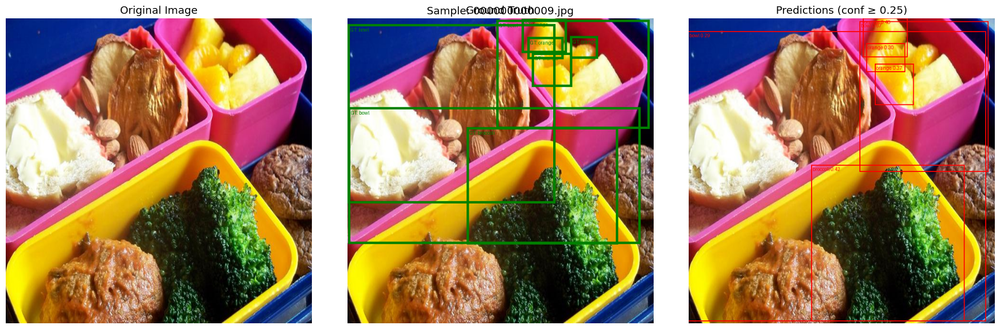

Ground truth boxes: 8
  GT 0: bowl at [1.0800000429153442, 187.69007873535156, 612.6697387695312, 473.53009033203125]
  GT 1: bowl at [311.7302551269531, 4.310160160064697, 631.01025390625, 232.99032592773438]
  GT 2: broccoli at [249.60032653808594, 229.27032470703125, 565.84033203125, 474.35015869140625]
  GT 3: bowl at [0.00031999999191612005, 13.510080337524414, 434.4803161621094, 388.63006591796875]
  GT 4: orange at [376.20001220703125, 40.35995864868164, 451.7500915527344, 86.88996124267578]
  GT 5: orange at [465.77972412109375, 38.96995162963867, 523.8497314453125, 85.63996887207031]
  GT 6: orange at [385.7001647949219, 73.65984344482422, 469.7200012207031, 144.169921875]
  GT 7: orange at [364.0495910644531, 2.490096092224121, 458.8099060058594, 73.55985260009766]

Predicted boxes: 6
  Pred 0: bowl 0.67 at [357.588623046875, 7.7919464111328125, 626.9951171875, 322.1689453125]
  Pred 1: broccoli 0.42 at [256.004638671875, 308.34735107421875, 576.8977661132812, 635.52600097656

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


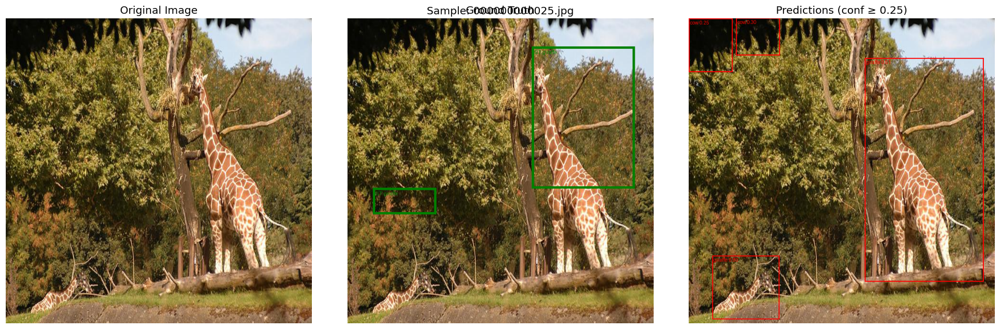

Ground truth boxes: 2
  GT 0: giraffe at [385.5299072265625, 60.03000259399414, 600.5001831054688, 357.19012451171875]
  GT 1: giraffe at [53.01023864746094, 356.4900207519531, 185.04031372070312, 411.6800231933594]

Predicted boxes: 4
  Pred 0: giraffe 0.80 at [49.52308654785156, 498.1255187988281, 189.9813995361328, 631.2803955078125]
  Pred 1: giraffe 0.51 at [368.60186767578125, 84.05757141113281, 616.5462036132812, 552.4628295898438]
  Pred 2: cow 0.30 at [99.55864715576172, 0.48526763916015625, 190.02264404296875, 78.10709381103516]
  Pred 3: cow 0.25 at [0.36249542236328125, 1.0950050354003906, 91.19326782226562, 113.87544250488281]


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


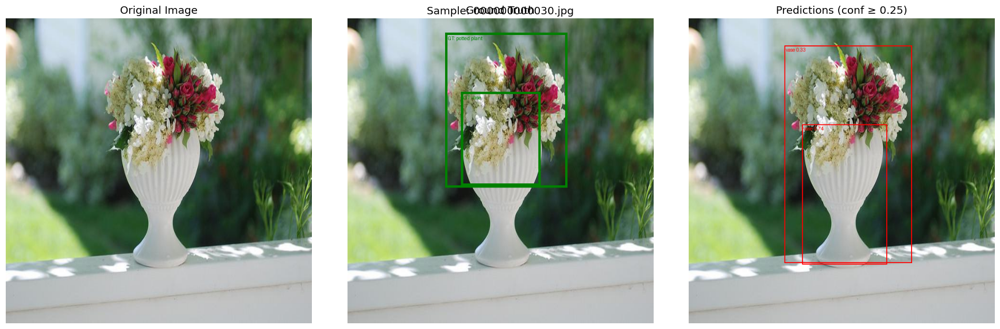

Ground truth boxes: 2
  GT 0: potted plant at [204.8601531982422, 31.01972770690918, 459.74017333984375, 355.1398620605469]
  GT 1: vase at [237.56031799316406, 155.8099822998047, 403.9603271484375, 351.0601501464844]

Predicted boxes: 2
  Pred 0: vase 0.74 at [237.74365234375, 223.61447143554688, 414.50421142578125, 516.27294921875]
  Pred 1: vase 0.33 at [200.27340698242188, 58.30970764160156, 466.7704162597656, 513.2083740234375]


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


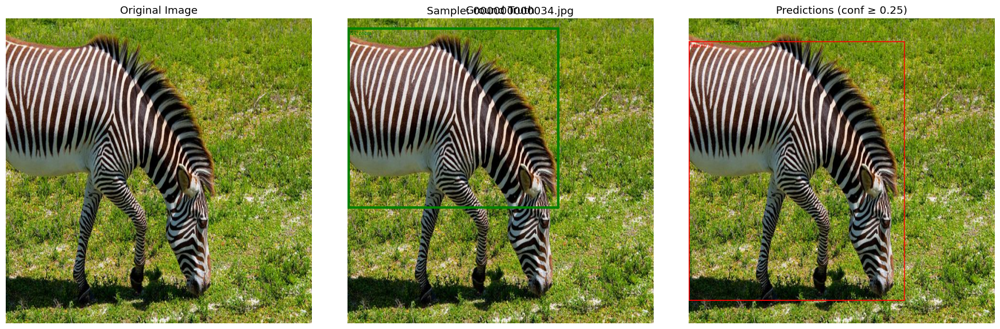

Ground truth boxes: 1
  GT 0: zebra at [0.9599999785423279, 20.059999465942383, 442.1900939941406, 399.21014404296875]

Predicted boxes: 1
  Pred 0: zebra 0.76 at [0.1103668212890625, 49.590362548828125, 451.6658935546875, 592.43115234375]


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:880: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


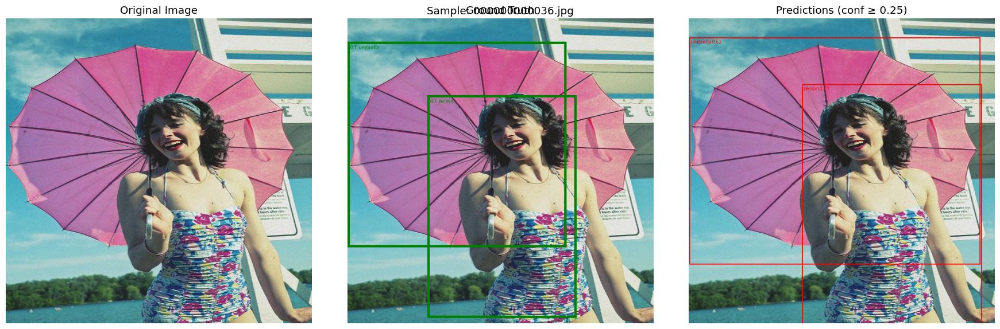

Ground truth boxes: 2
  GT 0: umbrella at [0.0, 50.11967849731445, 457.6801452636719, 480.4697570800781]
  GT 1: person at [167.5801544189453, 162.88992309570312, 478.19024658203125, 628.0796508789062]

Predicted boxes: 2
  Pred 0: person 0.71 at [237.9684295654297, 139.72323608398438, 612.7451171875, 646.3399658203125]
  Pred 1: umbrella 0.52 at [1.3441162109375, 41.43492126464844, 609.787841796875, 516.374267578125]


In [ ]:
for i in range(5):
    visualize_sample(
        images_dir="./data/coco128/images/train2017",
        labels_dir="./data/coco128/labels/train2017",
        model=model,
        sample_idx=i
    )

# Task 2. Segmenation

In this task, you will implement a segmentation algorithm.

The dataset for this task is the Oxford Pets dataset (https://www.robots.ox.ac.uk/~vgg/data/pets/). The dataset contains images of cats and dogs, along with their corresponding segmentation masks.
We simplify the masks to binary masks, where the foreground is the animal and the background is everything else; we ignore the border class.
The dataset is split into a training set and a test set. The training set contains ~ 3,700 images, while the test set contains 3,000 images.

Use U-Net to perform binary semantic segmentation.
1. (**0.5p -- 2p**) Implement U-Net (https://arxiv.org/abs/1505.04597) using PyTorch. You may use padded convolutions to avoid losing border pixels. Consider adding batch normalization.
2. (**1p**) Use Binary Cross Entropy to train the model and visualize predictions. Ignore the border class during loss computation.
3. (**1p**) Implement and calculate pixel accuracy, IoU and Dice coefficient.
4. (**1p**) Try different ways to deal with varied input sizes (resize, crop to smaller size, add padding). Then, pick a few images from the test set and perform inference on them while keeping their original size. Compare the results.
5. (**0.5p**) Perform an ablation study on residual connections in the U-Net architecture.



## Installation

In [ ]:
!pip install segmentation_models_pytorch -q
!pip install wandb -qU

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 92.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 43.9 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade wandb


## Some useful code

In [ ]:
import torch
import segmentation_models_pytorch as smp
import matplotlib.pyplot as plt


from typing import Optional

from torch import nn
from torch.nn import BCEWithLogitsLoss, CrossEntropyLoss
from torch.utils.data import DataLoader
from torchvision.transforms import v2
from torchvision.datasets import wrap_dataset_for_transforms_v2, OxfordIIITPet
from torchvision.tv_tensors import Mask
from tqdm.auto import tqdm
import numpy as np

In [ ]:
import wandb
wandb.login(key='63687cab377c2b55c0ad6197883c86191343f549')

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: kicza to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
class SegmentationDatasetWrapper(torch.utils.data.Dataset):
    def __init__(self, dataset, transform, length=None):
        self.dataset = dataset
        self.length = len(dataset)
        self.transform = transform

    def __getitem__(self, index):
        image, mask = self.dataset[index]
        return self.transform(image, mask)

    def __len__(self):
        return self.length

def create_wrapped_dataset(dataset, transform):
    wrapped_dataset = wrap_dataset_for_transforms_v2(dataset)
    return SegmentationDatasetWrapper(wrapped_dataset, transform=transform)


IMG_SIZE = (128, 128)

transform = v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])
target_transform = lambda mask: Mask(2 - mask.squeeze(0))

train_ds_orig = OxfordIIITPet(root=".", target_types="segmentation", download=True, transform=transform, target_transform=target_transform)
train_ds = create_wrapped_dataset(train_ds_orig, transform=v2.Resize(size=IMG_SIZE, antialias=True))

test_ds_orig = OxfordIIITPet(root=".", split="test", target_types="segmentation", download=True, transform=transform, target_transform=target_transform)
test_ds = create_wrapped_dataset(test_ds_orig, transform=v2.Resize(size=IMG_SIZE, antialias=True))

100%|██████████| 792M/792M [00:10<00:00, 78.4MB/s]
100%|██████████| 19.2M/19.2M [00:00<00:00, 69.9MB/s]


### Plot original image and mask

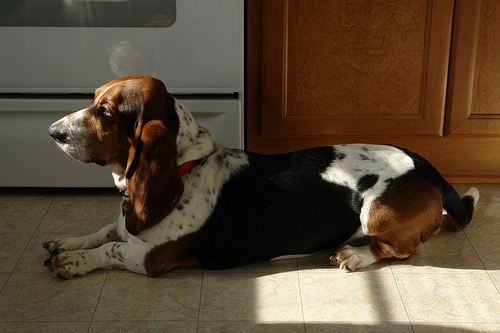

In [ ]:
# Plot sample image
image_orig, mask_orig = train_ds_orig[2025]
image_orig

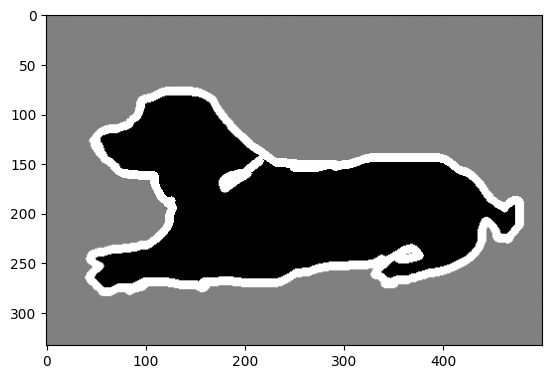

In [ ]:
mask_np = np.array(mask_orig)
plt.imshow(mask_np, cmap="gray")
plt.show()

### Plot resized image and mask

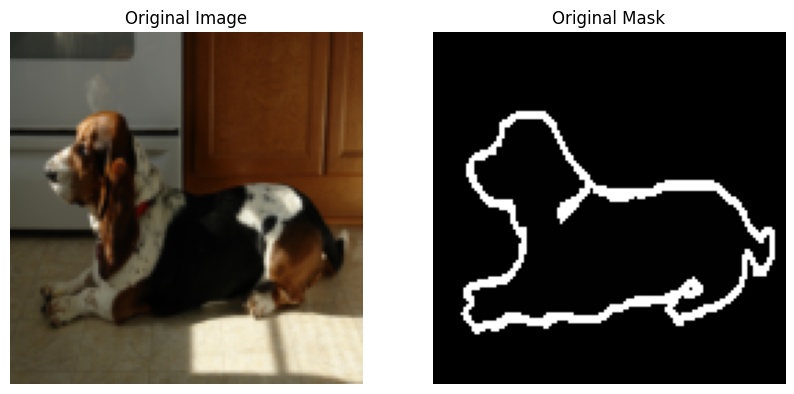

In [ ]:
image, mask = train_ds[2025]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image.permute(1, 2, 0))
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(mask.squeeze(0), cmap="gray")
plt.title("Original Mask")
plt.axis("off")
plt.show()

### Masks

Observe, that we modify the masks (1: foreground, 2: background, 3: border) to be (0: background, 1: foreground, 255: border).

Later we will ignore the border class during loss computation.

In [ ]:
mask.unique()  # tensor([0, 1], dtype=torch.uint8)

tensor([  0,   1, 255], dtype=torch.uint8)

In [ ]:
# TASK 1.3:
def iou(gt, pred, ignore_index=255, eps=1e-8):
    pred[gt == ignore_index] = 0
    gt[gt == ignore_index] = 0

    intersection = (gt * pred).float().sum(dim=1)
    union = ((gt + pred) > 0).float().sum(dim=1)

    iou = (intersection + eps) / (union + eps)
    return iou

def dice(gt, pred, ignore_index=255, eps=1e-8):
    pred[gt == ignore_index] = 0
    gt[gt == ignore_index] = 0

    intersection = (gt * pred).float().sum(dim=1)
    total = gt.float().sum(dim=1) + pred.float().sum(dim=1)

    dice = (2 * intersection + eps) / (total + eps)
    return dice

def accuracy(gt, pred, ignore_index=255):
    pred[gt == ignore_index] = 0
    gt[gt == ignore_index] = 0

    correct = (gt == pred).float().sum(dim=1)
    total = (gt != ignore_index).float().sum(dim=1)

    acc = correct / (total + 1e-8)
    return acc


def eval(model, dataloader):
    model.eval()

    metrics = {
        "loss": 0,
        "iou": 0,
        "dice": 0,
        "accuracy": 0,
    }

    ds_len = 0

    for batch in dataloader:
        images, masks = batch
        images = images.cuda()
        masks = masks.cuda()

        ds_len += images.shape[0]
        with torch.no_grad():
            loss, logits = model(images, masks)
            labels = torch.flatten(torch.sigmoid(logits) > 0.5, 1)
            gt = torch.flatten(masks, 1)

            metrics["loss"] += loss.sum().item()
            metrics["iou"] += iou(gt, labels).sum().item()
            metrics["dice"] += dice(gt, labels).sum().item()
            metrics["accuracy"] += accuracy(gt, labels).sum().item()

    for metric in metrics:
        metrics[metric] /= ds_len

    return metrics

## Model

In [ ]:
# TASK 1:
# Implement a UNet model
# (2p) implement a UNet model in pure pytorch
# (0.5p) implement a UNet model using segmentation_models_pytorch package
#        (see https://github.com/qubvel-org/segmentation_models.pytorch?tab=readme-ov-file#1-create-your-first-segmentation-model-with-smp),
#        remember to use encoder_weights=None
# Hint:
# - 'resnet18' as the encoder backbone could be a good choice for faster training
# - 'resnet34' as the encoder backbone could be a good choice for better accuracy

class UNet(nn.Module):
    def __init__(self, ignore_index=255):
        super(UNet, self).__init__()
        # TODO: implement a UNet model here
        self.ignore_index = ignore_index

    def forward(
        self,
        pixel_values: torch.FloatTensor,
        labels: Optional[torch.LongTensor] = None,
    ):
        logits = self.unet(pixel_values)

        loss = None
        if labels is not None:
            loss = _ # TODO: implement the loss function; Hint: use BCEWithLogitsLoss(reduction="none")
        return loss, logits

In [ ]:
#First model (Custom U-Net):
#Uses skip connections via concatenation. The feature maps from the encoder are concatenated with the upsampled feature maps in the decoder. No addition of the input and output at any block.

#Second model (U-Net with ResNet18 backbone):
#Uses residual connections from ResNet18, which means the input to a block is added to the output of the block (mathematical +), allowing the network to learn residual mappings.



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from typing import Optional

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.net(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Down, self).__init__()
        self.net = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.net(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, n_classes=1, ignore_index=255):
        super(UNet, self).__init__()
        self.ignore_index = ignore_index
        self.in_channels = in_channels
        self.n_classes = n_classes

        self.inc = DoubleConv(in_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024)
        self.up1 = Up(1024 + 512, 512)
        self.up2 = Up(512 + 256, 256)
        self.up3 = Up(256 + 128, 128)
        self.up4 = Up(128 + 64, 64)
        self.outc = OutConv(64, n_classes)

    def unet(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        return self.outc(x)

    def forward(self, pixel_values: torch.FloatTensor, labels: Optional[torch.LongTensor] = None):
        logits = self.unet(pixel_values)
        loss = None
        if labels is not None:
            criterion = nn.BCEWithLogitsLoss(reduction="none")
            loss_map = criterion(logits.squeeze(1), labels.float())
            mask = (labels != self.ignore_index).float()
            loss = (loss_map * mask).sum() / mask.sum()
        return loss, logits


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18
from typing import Optional

class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x1, x2):
        x1 = F.interpolate(x1, size=x2.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x1, x2], dim=1)
        return self.conv(x)

class UNet2(nn.Module):
    def __init__(self, in_channels=3, n_classes=1, ignore_index=255):
        super().__init__()
        self.ignore_index = ignore_index
        base_model = resnet18(weights=None)

        self.input_conv = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False),
            base_model.bn1,
            base_model.relu
        )

        self.encoder1 = base_model.layer1  # 64
        self.encoder2 = base_model.layer2  # 128
        self.encoder3 = base_model.layer3  # 256
        self.encoder4 = base_model.layer4  # 512

        self.up1 = Up(512 + 256, 256)
        self.up2 = Up(256 + 128, 128)
        self.up3 = Up(128 + 64, 64)
        self.up4 = Up(64 + 64, 32)

        self.final_conv = nn.Conv2d(32, n_classes, kernel_size=1)

    def unet(self, x):
        x0 = self.input_conv(x)            # [B, 64, H/2, W/2]
        x1 = self.encoder1(x0)             # [B, 64, H/2, W/2]
        x2 = self.encoder2(x1)             # [B, 128, H/4, W/4]
        x3 = self.encoder3(x2)             # [B, 256, H/8, W/8]
        x4 = self.encoder4(x3)             # [B, 512, H/16, W/16]

        u1 = self.up1(x4, x3)              # -> [B, 256, H/8, W/8]
        u2 = self.up2(u1, x2)              # -> [B, 128, H/4, W/4]
        u3 = self.up3(u2, x1)              # -> [B, 64, H/2, W/2]
        u4 = self.up4(u3, x0)              # -> [B, 32, H/2, W/2]

        out = self.final_conv(u4)          # -> [B, 1, H/2, W/2]
        out = F.interpolate(out, size=x.shape[2:], mode='bilinear', align_corners=False)
        return out

    def forward(self, pixel_values: torch.FloatTensor, labels: Optional[torch.LongTensor] = None):
        logits = self.unet(pixel_values)
        loss = None
        if labels is not None:
            criterion = nn.BCEWithLogitsLoss(reduction="none")
            loss_map = criterion(logits.squeeze(1), labels.float())
            mask = (labels != self.ignore_index).float()
            loss = (loss_map * mask).sum() / mask.sum()
        return loss, logits


### Create dataloaders

One can experiment with different batch sizes.

In [ ]:
train_dataloder = DataLoader(train_ds, batch_size=16, shuffle=True)
test_dataloder = DataLoader(test_ds, batch_size=16, shuffle=False)

## Training

Below is the training loop and some partial results from W&B tracking.
The project is not shared.

In [ ]:
train_dataloder = DataLoader(train_ds, batch_size=16, shuffle=True)
test_dataloder = DataLoader(test_ds, batch_size=16, shuffle=False)

ignore_index = 255

config = {
    "learning_rate": 1e-4,
    "epochs": 3,
    "img_size": IMG_SIZE,
    # TODO: add other hyperparameters here (e.g. batch size, model architecture, etc.)
}

run = wandb.init(
    project="segmentation_example",
    config=config,
)

unet = UNet(ignore_index=ignore_index).cuda()
optimizer = torch.optim.Adam(unet.parameters(), lr=config["learning_rate"])

for epoch_idx in tqdm(range(config["epochs"]), desc="epoch"):
    unet.train()
    for batch in tqdm(train_dataloder, desc="batch"):
        optimizer.zero_grad()

        images, masks = batch
        images = images.cuda()
        masks = masks.cuda()

        loss, logits = unet(images.cuda(), masks.cuda())
        loss = loss.mean()
        loss.backward()
        optimizer.step()

        labels = torch.flatten(torch.sigmoid(logits) > 0.5, 1)
        gt = torch.flatten(masks, 1)

        run.log({
            "epoch": epoch_idx,
            "train/loss": loss.item(),
            "train/iou": iou(gt, labels).mean(),
            "train/dice": dice(gt, labels).mean(),
            "train/accuracy": accuracy(gt, labels).mean(),
            })

    metrics = eval(unet, test_dataloder)
    for metric, value in metrics.items():
        run.log({f"eval/{metric}": value})
run.finish()

In [ ]:
ignore_index = 255

config = {
    "learning_rate": 1e-4,
    "epochs": 3,
    "img_size": IMG_SIZE,
    # TODO: add other hyperparameters here (e.g. batch size, model architecture, etc.)
}

run = wandb.init(
    project="segmentation_example",
    config=config,
)

unet = UNet(ignore_index=ignore_index).cuda()
optimizer = torch.optim.Adam(unet.parameters(), lr=config["learning_rate"])

for epoch_idx in tqdm(range(config["epochs"]), desc="epoch"):
    unet.train()
    for batch in tqdm(train_dataloder, desc="batch"):
        optimizer.zero_grad()

        images, masks = batch
        images = images.cuda()
        masks = masks.cuda()

        loss, logits = unet(images.cuda(), masks.cuda())
        loss = loss.mean()
        loss.backward()
        optimizer.step()

        labels = torch.flatten(torch.sigmoid(logits) > 0.5, 1)
        gt = torch.flatten(masks, 1)

        run.log({
            "epoch": epoch_idx,
            "train/loss": loss.item(),
            "train/iou": iou(gt, labels).mean(),
            "train/dice": dice(gt, labels).mean(),
            "train/accuracy": accuracy(gt, labels).mean(),
            })

    metrics = eval(unet, test_dataloder)
    for metric, value in metrics.items():
        run.log({f"eval/{metric}": value})
run.finish()

epoch,▁▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅█████████████
eval/accuracy,▁█
eval/dice,▁█
eval/iou,▁█
eval/loss,█▁
train/accuracy,▁▂▃▃▃▅▆▅▆▅▆▅▆▆▆▆▇▆▆▅▆▇▆█▆▇▇█▆▆▆█▇█▇█▇▇█▇
train/dice,▂▁▃▁▅▃▄▅▅▅▅█▆▇▆▆▅▃▅▇▇▇▆▇▇▇▆▆▇█▆███▇▇▆█▇▇
train/iou,▁▃▄▃▄▅▃▄▃▄▆▅▅▅▃▅▅▆▅▆▆▄▇▅▆▆▇▇▆▇▇▅▆▇▇▅▇▇█▇
train/loss,█▄▄▄▃▄▃▃▄▃▃▃▂▂▃▃▃▃▃▃▂▃▂▂▃▂▁▂▂▁▃▃▂▃▁▂▂▂▁▂
epoch,2
eval/accuracy,0.92654


epoch:   0%|          | 0/3 [00:00<?, ?it/s]

batch:   0%|          | 0/230 [00:00<?, ?it/s]

In [ ]:
ignore_index = 255

config = {
    "learning_rate": 1e-4,
    "epochs": 3,
    "img_size": IMG_SIZE,
    # TODO: add other hyperparameters here (e.g. batch size, model architecture, etc.)
}

run = wandb.init(
    project="segmentation_example",
    config=config,
)

unet2 = UNet2(ignore_index=ignore_index).cuda()
optimizer = torch.optim.Adam(unet.parameters(), lr=config["learning_rate"])

for epoch_idx in tqdm(range(config["epochs"]), desc="epoch"):
    unet.train()
    for batch in tqdm(train_dataloder, desc="batch"):
        optimizer.zero_grad()

        images, masks = batch
        images = images.cuda()
        masks = masks.cuda()

        loss, logits = unet(images.cuda(), masks.cuda())
        loss = loss.mean()
        loss.backward()
        optimizer.step()

        labels = torch.flatten(torch.sigmoid(logits) > 0.5, 1)
        gt = torch.flatten(masks, 1)

        run.log({
            "epoch": epoch_idx,
            "train/loss": loss.item(),
            "train/iou": iou(gt, labels).mean(),
            "train/dice": dice(gt, labels).mean(),
            "train/accuracy": accuracy(gt, labels).mean(),
            })

    metrics = eval(unet, test_dataloder)
    for metric, value in metrics.items():
        run.log({f"eval/{metric}": value})
run.finish()

epoch:   0%|          | 0/3 [00:00<?, ?it/s]

batch:   0%|          | 0/230 [00:00<?, ?it/s]

batch:   0%|          | 0/230 [00:00<?, ?it/s]

batch:   0%|          | 0/230 [00:00<?, ?it/s]

epoch,▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▅▅▅▅▅▅▅▅███████████████
eval/accuracy,▁▆█
eval/dice,▁▅█
eval/iou,▁▅█
eval/loss,█▂▁
train/accuracy,▅▄▇▄▅▃▆▅▆▄▃▇▇▆▅▆▅▇█▆▁▂▆▆▅▅▆▅▅▇▆▆▆▅▄▆▆▅█▇
train/dice,▁▅▇▇▄▃▅▅▆▆▇▆▄█▆▅█▆▆█▅▆▆▆▂▆█▇▄▆▇███▇▃▇█▆▆
train/iou,▅▅▄▅▆▃▅▁▃▅▆▃▅▆▆▅▆▄▅▇▇▅▅▆▆█▇▇▅▇▅▆▇▇▇▄▇▆▇▇
train/loss,▇▄▅▅█▆▄▃▂▆▅▃▅▄█▄▃▂▂▄▂▃▄▄▄▂▅▂▂▄▆▂▁▅▂▅▇▄▁▁
epoch,2
eval/accuracy,0.9485


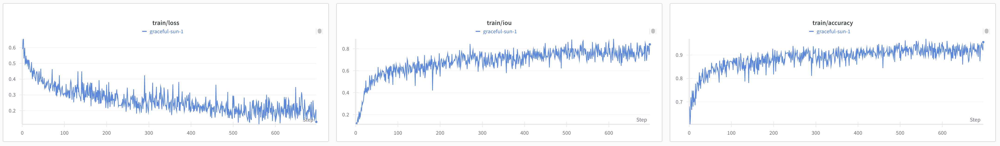

In [ ]:
unet

### Task 2.4

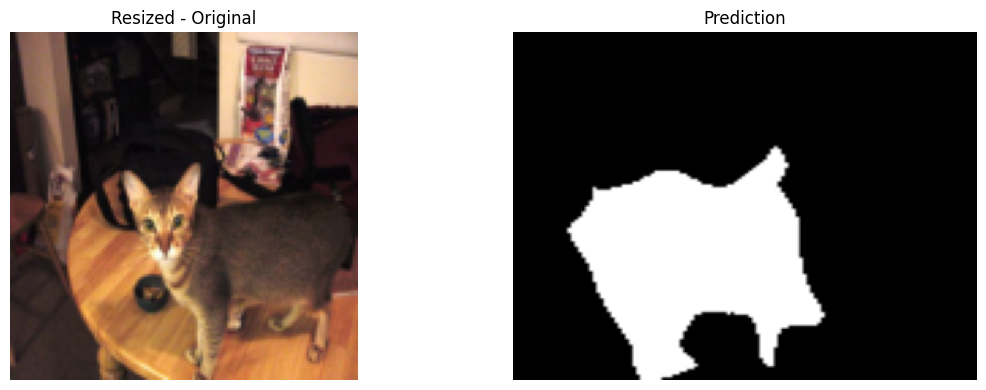

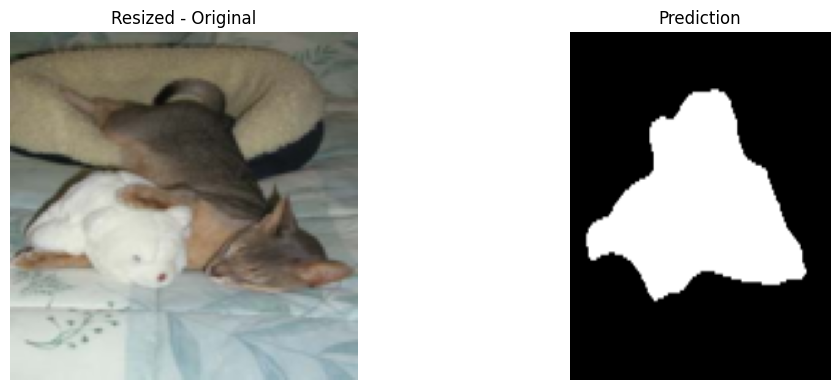

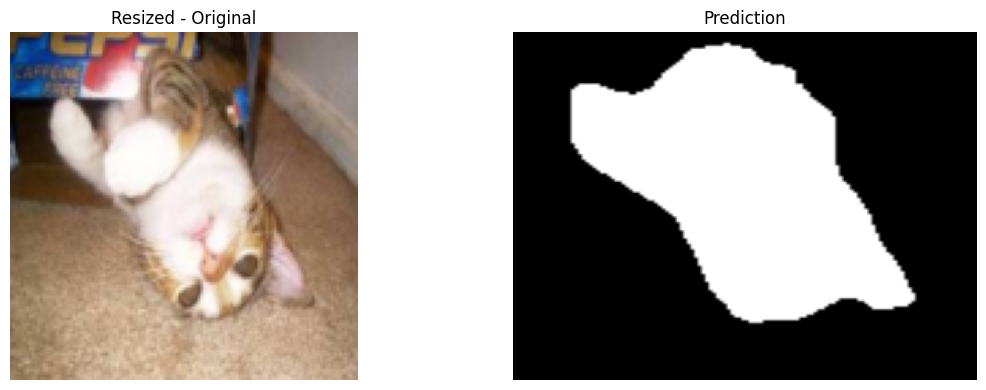

=== Resized Metrics ===
Avg IoU:     0.2768
Avg Dice:    0.4312
Avg Accuracy:0.2646



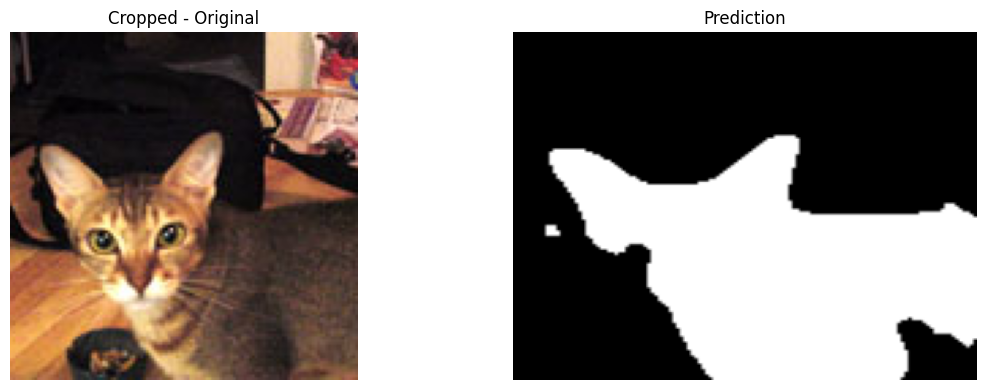

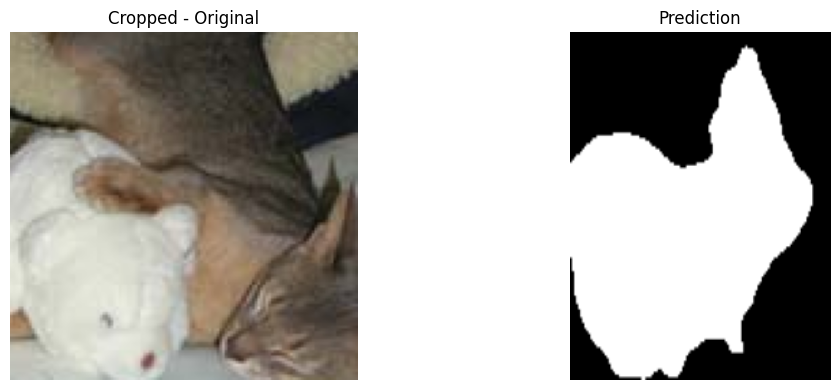

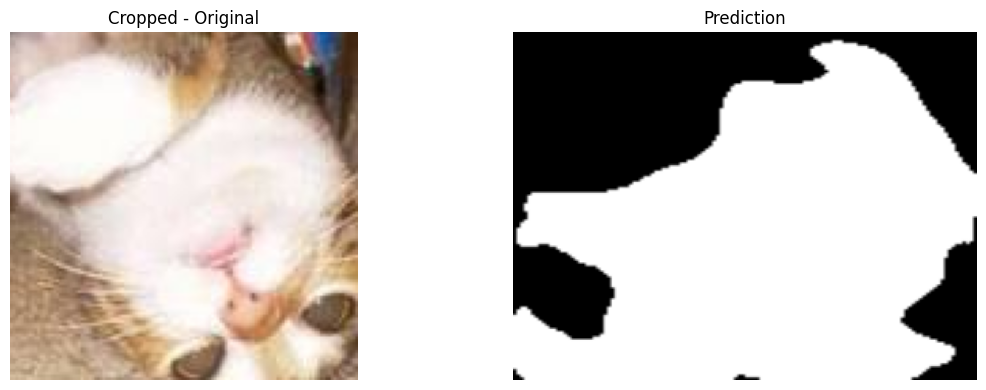

=== Cropped Metrics ===
Avg IoU:     0.5181
Avg Dice:    0.6761
Avg Accuracy:0.5034



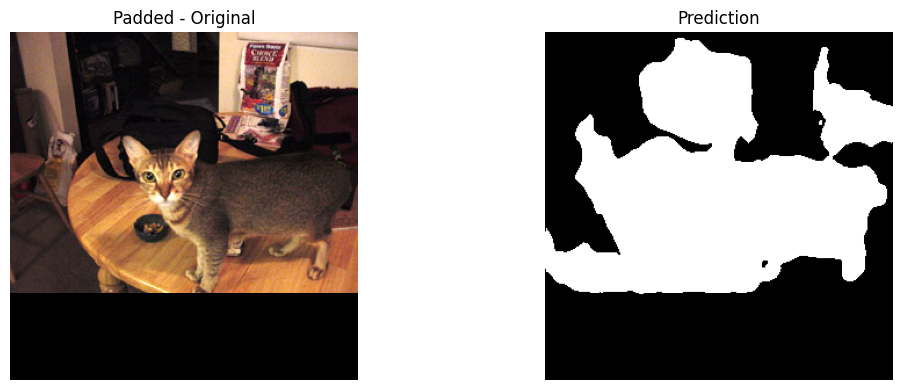

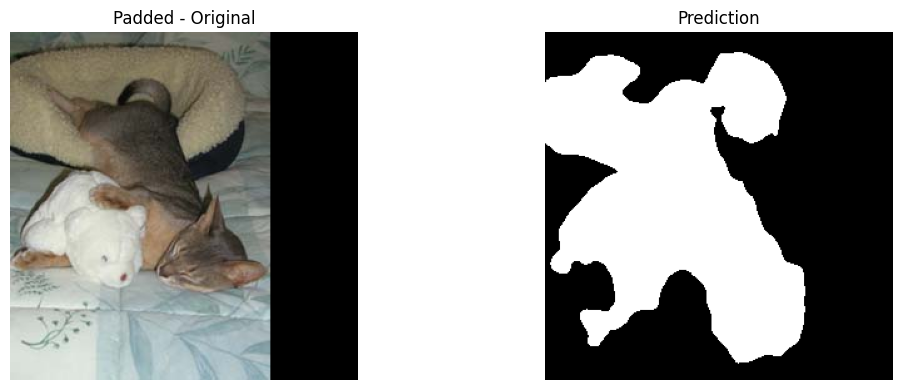

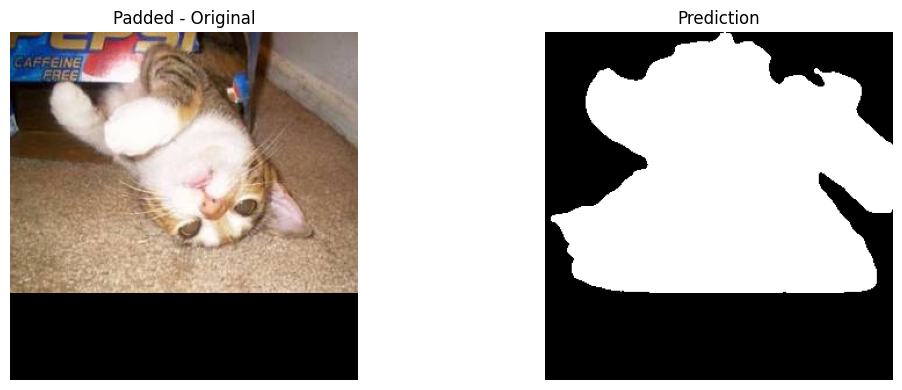

=== Padded Metrics ===
Avg IoU:     0.6097
Avg Dice:    0.7556
Avg Accuracy:0.7075



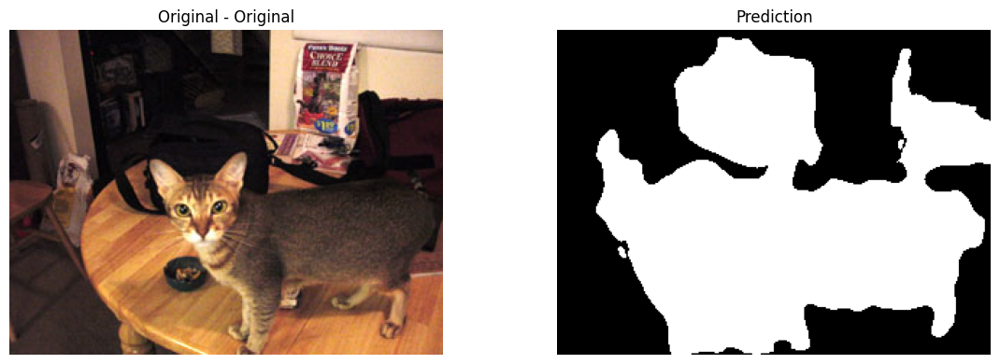

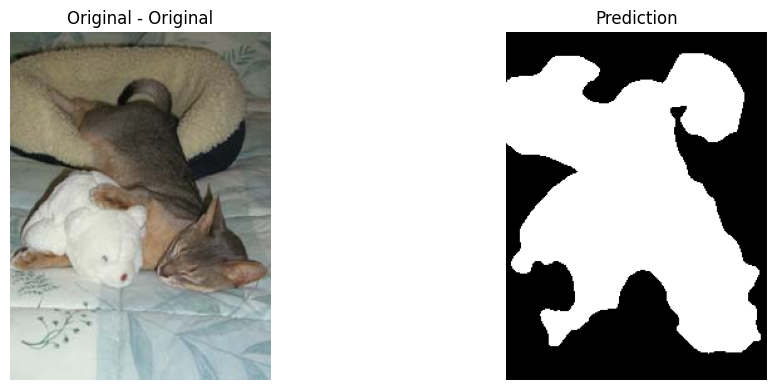

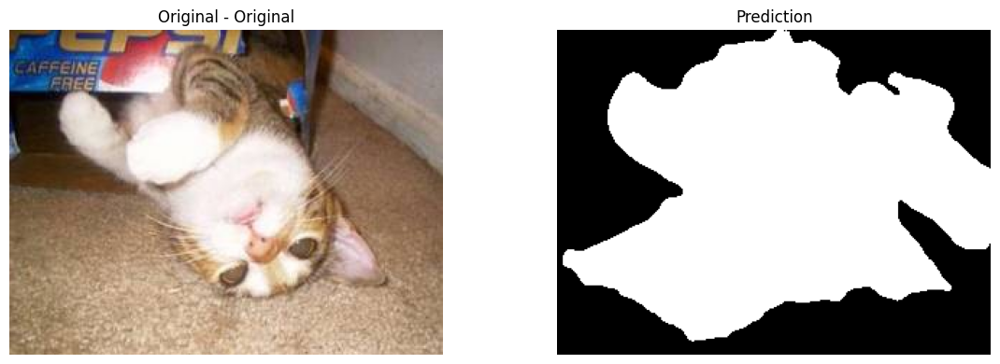

=== Original Metrics ===
Avg IoU:     0.5463
Avg Dice:    0.7063
Avg Accuracy:0.5463



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18
from torchvision.datasets import OxfordIIITPet
from torchvision.transforms import v2
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from typing import Optional
import numpy as np
import torchvision.transforms.v2.functional as Fv2


class SegmentationDatasetWrapper(torch.utils.data.Dataset):
    def __init__(self, dataset, transform):
        self.dataset = dataset
        self.transform = transform

    def __getitem__(self, index):
        image, mask = self.dataset[index]
        return self.transform(image, mask)

    def __len__(self):
        return len(self.dataset)

def wrap_dataset_for_transforms_v2(dataset):
    return dataset

def create_wrapped_dataset(dataset, transform):
    wrapped_dataset = wrap_dataset_for_transforms_v2(dataset)
    return SegmentationDatasetWrapper(wrapped_dataset, transform=transform)

IMG_SIZE = (128, 128)

base_transform = v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])
resize_transform = v2.Resize(size=IMG_SIZE, antialias=True)
crop_transform = v2.CenterCrop(size=IMG_SIZE)

class PadToSquare:
    def __call__(self, image, mask):
        h, w = image.shape[-2:]
        size = max(h, w)
        pad_h = size - h
        pad_w = size - w
        image = torch.nn.functional.pad(image, (0, pad_w, 0, pad_h), value=0)
        mask = torch.nn.functional.pad(mask, (0, pad_w, 0, pad_h), value=255)
        return image, mask

target_transform = lambda mask: 2 - Fv2.to_dtype(Fv2.to_image(mask), torch.int64).squeeze(0)

test_ds_orig = OxfordIIITPet(root=".", split="test", target_types="segmentation", download=True,
                             transform=base_transform, target_transform=target_transform)

test_ds_resize = create_wrapped_dataset(test_ds_orig, transform=resize_transform)
test_ds_crop = create_wrapped_dataset(test_ds_orig, transform=crop_transform)
test_ds_pad = create_wrapped_dataset(test_ds_orig, transform=PadToSquare())

def iou(gt, pred, ignore_index=255, eps=1e-8):
    pred = pred.clone()
    gt = gt.clone()
    pred[gt == ignore_index] = 0
    gt[gt == ignore_index] = 0
    intersection = (gt * pred).float().sum()
    union = ((gt + pred) > 0).float().sum()
    return (intersection + eps) / (union + eps)

def dice(gt, pred, ignore_index=255, eps=1e-8):
    pred = pred.clone()
    gt = gt.clone()
    pred[gt == ignore_index] = 0
    gt[gt == ignore_index] = 0
    intersection = (gt * pred).float().sum()
    total = gt.float().sum() + pred.float().sum()
    return (2 * intersection + eps) / (total + eps)

def accuracy(gt, pred, ignore_index=255):
    pred = pred.clone()
    gt = gt.clone()
    pred[gt == ignore_index] = 0
    gt[gt == ignore_index] = 0
    correct = (gt == pred).float().sum()
    total = (gt != ignore_index).float().sum()
    return correct / (total + 1e-8)

def infer_and_plot(model, dataset, indices, title_prefix):
    model.eval()
    ious, dices, accs = [], [], []

    for idx in indices:
        image, mask = dataset[idx]

        with torch.no_grad():
            input_tensor = image.unsqueeze(0).to(device)
            _, logits = model(input_tensor)
            pred_mask = (torch.sigmoid(logits) > 0.5).float().cpu()
            pred_mask_resized = F.interpolate(
                pred_mask,
                size=mask.shape[-2:],
                mode='bilinear',
                align_corners=False
            ).squeeze(0).squeeze(0)
            gt_mask2 = (mask != 255).float()
            gt_mask2[mask == 255] = 0

        current_iou = iou(gt_mask2, pred_mask_resized)
        current_dice = dice(gt_mask2, pred_mask_resized)
        current_acc = accuracy(gt_mask2, pred_mask_resized)

        ious.append(current_iou)
        dices.append(current_dice)
        accs.append(current_acc)

        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        axs[0].imshow(image.permute(1, 2, 0).cpu())
        axs[0].set_title(f"{title_prefix} - Original")
        axs[1].imshow(pred_mask_resized.cpu(), cmap='gray', vmin=0, vmax=1)
        axs[1].set_title("Prediction")
        for ax in axs:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

    print(f"=== {title_prefix} Metrics ===")
    print(f"Avg IoU:     {np.mean(ious):.4f}")
    print(f"Avg Dice:    {np.mean(dices):.4f}")
    print(f"Avg Accuracy:{np.mean(accs):.4f}")
    print()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = unet

sample_indices = [0, 5, 10]

infer_and_plot(model, test_ds_resize, sample_indices, "Resized")
infer_and_plot(model, test_ds_crop, sample_indices, "Cropped")
infer_and_plot(model, test_ds_pad, sample_indices, "Padded")
infer_and_plot(model, test_ds_orig, sample_indices, "Original")


In [ ]:
def check_image_shape(dataset, idx=0):
    image, target = dataset[idx]
    print("Image shape:", image.shape)  # Should be (3, H, W) for RGB images
    print("Target shape:", target.shape)  # Should be (H, W) for the mask

# Check for the first image in the dataset
check_image_shape(train_ds_resized, idx=0)


ValueError: not enough values to unpack (expected 3, got 2)

In [ ]:
import wandb
wandb.login(key='63687cab377c2b55c0ad6197883c86191343f549')

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: kicza to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision.datasets import OxfordIIITPet
from torchvision.transforms import v2
from torchvision.transforms.v2.functional import resize, center_crop, pad
from torchvision.transforms.v2 import InterpolationMode
import numpy as np
from tqdm import tqdm
import wandb
import matplotlib.pyplot as plt

# ------------------- CONFIG -------------------
IMG_SIZE = (128, 128)
BATCH_SIZE = 16
EPOCHS = 3
IGNORE_INDEX = 255

config = {
    "learning_rate": 1e-4,
    "epochs": EPOCHS,
    "batch_size": BATCH_SIZE,
    "img_size": IMG_SIZE,
}

# ------------------- MODEL -------------------
class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 2, stride=2), nn.ReLU(),
            nn.ConvTranspose2d(16, 1, 2, stride=2)
        )
        self.loss_fn = nn.BCEWithLogitsLoss()

    def forward(self, x, y=None):
        x = self.encoder(x)
        x = self.decoder(x)
        if y is not None:
            loss = self.loss_fn(x.squeeze(1), y.float())
            return loss, x
        return x

# ------------------- METRICS -------------------
def iou(pred, target):
    pred = pred.bool()
    target = target.bool()
    return (pred & target).sum(1).float() / ((pred | target).sum(1).float() + 1e-6)

def dice(pred, target):
    pred = pred.bool()
    target = target.bool()
    return (2 * (pred & target).sum(1).float()) / (pred.sum(1) + target.sum(1) + 1e-6)

def accuracy(pred, target):
    return (pred == target).float().mean()

# ------------------- DATASET WRAPPER -------------------
class SegmentationDatasetWrapper(Dataset):
    def __init__(self, base_dataset, strategy="resize"):
        self.base_dataset = base_dataset
        self.strategy = strategy

    def __getitem__(self, idx):
        image, mask = self.base_dataset[idx]

        # Apply resizing/cropping/padding to image and mask
        if self.strategy == "resize":
            image = resize(image, IMG_SIZE, interpolation=InterpolationMode.BILINEAR, antialias=True)
            mask = resize(mask, IMG_SIZE, interpolation=InterpolationMode.NEAREST)
        elif self.strategy == "crop":
            image = center_crop(image, IMG_SIZE)
            mask = center_crop(mask, IMG_SIZE)
        elif self.strategy == "pad":
            pad_h = max(0, IMG_SIZE[0] - image.size[1])
            pad_w = max(0, IMG_SIZE[1] - image.size[0])
            image = pad(image, [0, 0, pad_w, pad_h])
            mask = pad(mask, [0, 0, pad_w, pad_h], fill=IGNORE_INDEX)
        else:
            raise ValueError(f"Unknown strategy: {self.strategy}")

        image = v2.ToImage()(image)
        image = v2.ToDtype(torch.float32, scale=True)(image)

        mask = torch.as_tensor(np.array(mask), dtype=torch.long)
        #mask = torch.where(mask == 1, 1, 0)  # Binary classification

        return image, mask

    def __len__(self):
        return len(self.base_dataset)

# ------------------- TRAINING -------------------
def train_model(strategy):
    run = wandb.init(project="segmentation_size_handling", config={**config, "strategy": strategy})

    train_base = OxfordIIITPet(root=".", target_types="segmentation", download=True)
    test_base = OxfordIIITPet(root=".", split="test", target_types="segmentation", download=True)

    train_ds = SegmentationDatasetWrapper(train_base, strategy=strategy)
    test_ds = SegmentationDatasetWrapper(test_base, strategy="resize")

    train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
    test_dl = DataLoader(test_ds, batch_size=BATCH_SIZE)

    model = UNet().cuda()
    optimizer = torch.optim.Adam(model.parameters(), lr=config["learning_rate"])

    for epoch in tqdm(range(EPOCHS), desc="Epoch"):
        model.train()
        for images, masks in tqdm(train_dl, desc="Batch", leave=False):
            images, masks = images.cuda(), masks.cuda()
            optimizer.zero_grad()
            loss, logits = model(images, masks)
            loss.backward()
            optimizer.step()

            preds = torch.sigmoid(logits) > 0.5
            run.log({
                "loss": loss.item(),
                "iou": iou(preds.flatten(1), masks.flatten(1)).mean().item(),
                "dice": dice(preds.flatten(1), masks.flatten(1)).mean().item(),
                "accuracy": accuracy(preds.flatten(1), masks.flatten(1)).item(),
                "epoch": epoch
            })

    run.finish()
    return model, test_base

# ------------------- INFERENCE -------------------
def inference_original(model, dataset, idx=0):
    image, mask = dataset[idx]
    original_image = v2.ToDtype(torch.float32, scale=True)(v2.ToImage()(image)).unsqueeze(0).cuda()
    with torch.no_grad():
        resized = resize(image, IMG_SIZE)
        input_tensor = v2.ToDtype(torch.float32, scale=True)(v2.ToImage()(resized)).unsqueeze(0).cuda()
        logits = model(input_tensor)
        pred = torch.sigmoid(logits) > 0.5

    # Plotting
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(np.array(mask), cmap="gray")
    plt.title("Ground Truth")

    plt.subplot(1, 3, 3)
    plt.imshow(pred[0].squeeze().cpu(), cmap="gray")
    plt.title("Predicted (Resized Inference)")

    plt.show()

# ------------------- RUN ALL -------------------
if __name__ == "__main__":
    strategies = ["resize", "crop", "pad"]
    for strategy in strategies:
        print(f"\n--- Training with strategy: {strategy} ---")
        model, test_base = train_model(strategy)
        inference_original(model, test_base, idx=3)



--- Training with strategy: resize ---


Batch:   5%|▍         | 11/230 [00:01<00:23,  9.44it/s]

In [ ]:
pip install torch torchvision wandb tqdm

### Task 2.5

wyżej - unet i unet2